In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 

def science_plot(fontsize = 9):
    import scienceplots
    plt.style.use(['science','grid','notebook'])
    plt.rcParams.update({
        'font.size'       : fontsize,    # General font size
        'axes.titlesize'  : fontsize,    # Font size of the axes title
        'axes.labelsize'  : fontsize,    # Font size of the axes labels
        'xtick.labelsize' : fontsize,    # Font size of the x-axis tick labels
        'ytick.labelsize' : fontsize,    # Font size of the y-axis tick labels
        'legend.fontsize' : fontsize,    # Font size of the legend
        'figure.titlesize': fontsize,    # Font size of the figure title
        'legend.fancybox' : False,       # Disable the fancy box for legend
        'legend.edgecolor': 'k',         # Set legend border color to black
        'text.usetex'     : True,        # Use LaTeX for text rendering
        'font.family'     : 'serif'      # Set font family to serif
    })
science_plot()

In [4]:
data = pd.read_csv(r"C:\Users\verci\Documents\KSP 1.12.5\Kerbal.Space.Program.v1.12.5.3190.Incl.ALL.DLC\Kerbal.Space.Program.v1.12.5.3190.Incl.ALL.DLC\Ships\Script\terrain_data\kile_River2555x20.csv")

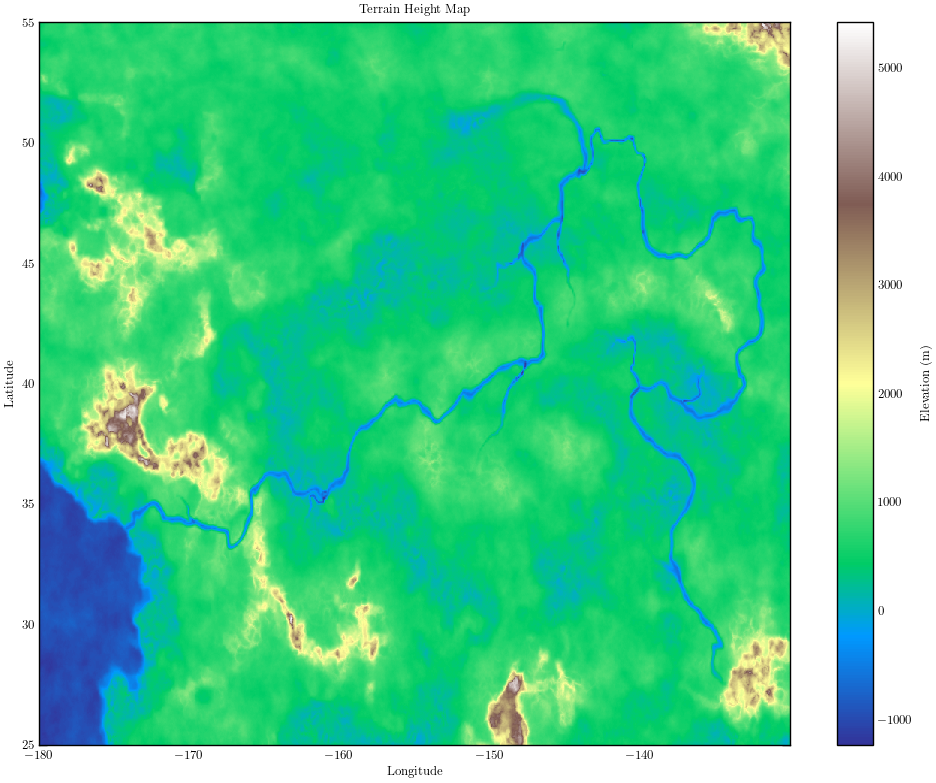

In [11]:
lat = data["lat"]
lon = data["lon"]
alt = data["alt"]

# Pivot the DataFrame to a 2D height grid
height_grid = data.pivot(index="lat", columns="lon", values="alt")

# Extract lat, lon, and height values
lat_vals = height_grid.index.values
lon_vals = height_grid.columns.values
heights = height_grid.values  # shape: (n_lats, n_lons)

# Make meshgrid for plotting
lon_grid, lat_grid = np.meshgrid(lon_vals, lat_vals)

# Plot the heightmap
plt.figure(figsize=(10, 8))
plt.pcolormesh(lon_grid, lat_grid, heights, shading='auto', cmap='terrain')
plt.colorbar(label="Elevation (m)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Terrain Height Map")

plt.tight_layout()
plt.grid()
plt.show()

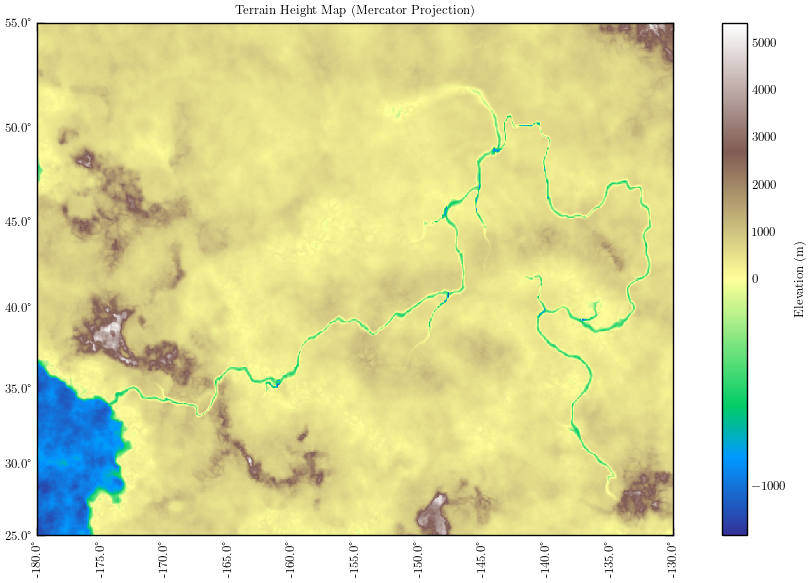

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm


def mercator_heightmap_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0  # for TwoSlopeNorm
):
    """
    Plot a 2D height map (elevation data) on a Mercator projection.
    
    Parameters:
    -----------
    lat_vals : 1D array
        Array of unique latitude values (in degrees).
        
    lon_vals : 1D array
        Array of unique longitude values (in degrees).
        
    height_grid : 2D array
        Array of height values (shape must match len(lat_vals) x len(lon_vals)).
        
    center_height : float
        Elevation value at which to center the color map (e.g., sea level = 0).
    """
    
    def lat_to_mercator_deg(y_deg):
        y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
        return np.degrees(y_merc)

    # Create meshgrid
    lon_grid, lat_grid = np.meshgrid(lon_vals, lat_vals)
    
    # Apply Mercator projection to latitudes
    lat_merc = lat_to_mercator_deg(lat_vals)
    _, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Normalize color map around center_height
    norm = TwoSlopeNorm(vmin=np.min(height_grid), vcenter=center_height, vmax=np.max(height_grid))
    
    # Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    mesh = ax.pcolormesh(lon_grid, lat_merc_grid, height_grid, shading='auto', cmap='terrain', norm=norm)
    plt.colorbar(mesh, ax=ax, label='Elevation (m)')

    if axline:
        ax.axhline(0, color="black")
        ax.axvline(0, color="black")
    if grid:
        ax.grid()
    ax.set_aspect('equal')

    # Axis ticks and labels
    min_lat, max_lat = latlims
    min_long, max_long = longlims

    lat_tick_degs = np.arange(np.ceil(min_lat / dlat) * dlat, np.floor(max_lat / dlat) * dlat + 1, dlat)
    y_tick_positions = lat_to_mercator_deg(lat_tick_degs)

    xticks = np.arange(np.ceil(min_long / dlong) * dlong, np.floor(max_long / dlong) * dlong + 1, dlong)

    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{long}°" for long in xticks])
    ax.tick_params(axis='x', labelrotation=long_label_rotation)
    ax.set_yticks(y_tick_positions)
    ax.set_yticklabels([f"{lat}°" for lat in lat_tick_degs])

    # Set limits
    ax.set_xlim(longlims)
    ax.set_ylim(lat_to_mercator_deg(latlims))
    ax.set_title("Terrain Height Map (Mercator Projection)")
    plt.tight_layout()
    plt.show()

mercator_heightmap_plot(
    lat_vals, lon_vals, heights,
    (-180,-130),(25,55),
    5,5)

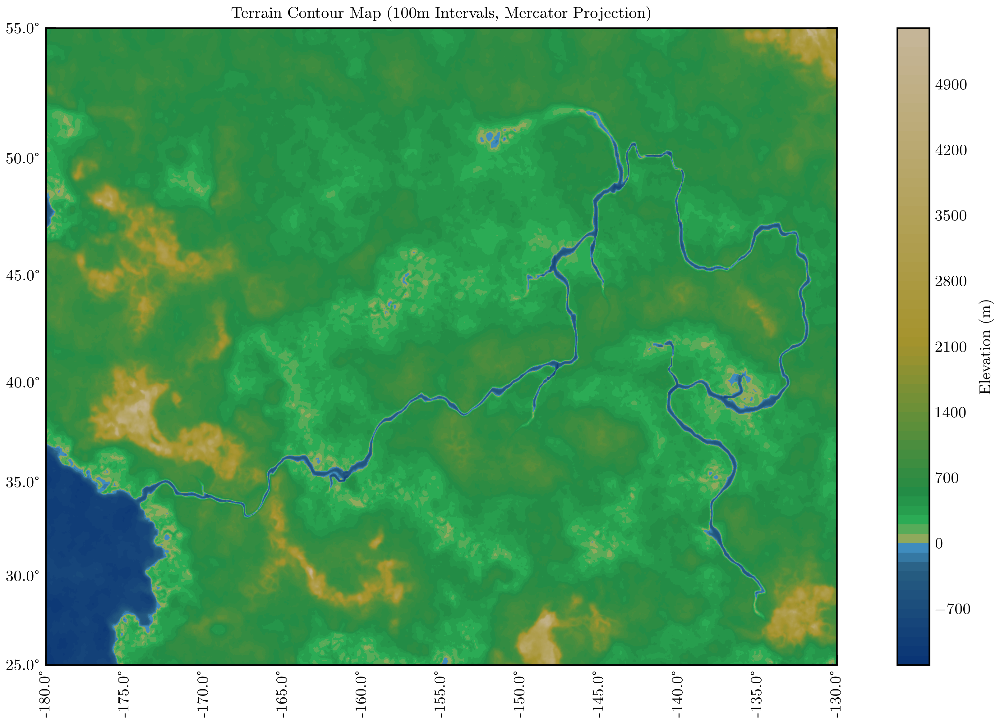

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm

def mercator_contour_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0,        # for TwoSlopeNorm
    contour_interval=100    # elevation step in meters
):
    def lat_to_mercator_deg(y_deg):
        y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
        return np.degrees(y_merc)

    # Meshgrid
    lon_grid, lat_grid = np.meshgrid(lon_vals, lat_vals)
    lat_merc = lat_to_mercator_deg(lat_vals)
    _, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Contour levels
    min_elev = np.nanmin(height_grid)
    max_elev = np.nanmax(height_grid)
    levels = np.arange(np.floor(min_elev / contour_interval) * contour_interval,
                       np.ceil(max_elev / contour_interval) * contour_interval + contour_interval,
                       contour_interval)

    # Normalization around center (e.g. 0 = sea level)
    norm = TwoSlopeNorm(vmin=min_elev, vcenter=center_height, vmax=max_elev)

    def make_blue_to_green_terrain():
        """Custom colormap: blue below sea level, green above, brown at higher altitudes."""
        return LinearSegmentedColormap.from_list("bluegreenland", [
        (0.00, "#0A3575"),   # deep blue
        (0.39, "#285e81"),
        (0.49, "#4292C6"),   # light blue (~just below sea level)
        (0.50, "#B8A75F"),
        (0.52, "#2BAD56"),
        (0.55, "#238B45"),   # green (~just above sea level)
        (0.70, "#A5932D"),   # light green
        (1.00, "#C5B597")    # brown at high elevation
    ])

    # Plot
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 400)
    custom_cmap = make_blue_to_green_terrain()
    contour = ax.contourf(lon_grid, lat_merc_grid, height_grid, levels=levels, cmap=custom_cmap, norm=norm)
    cbar = plt.colorbar(contour, ax=ax, label='Elevation (m)')
    
    if axline:
        ax.axhline(0, color="black")
        ax.axvline(0, color="black")
    if grid:
        ax.grid()
    ax.set_aspect('equal')

    # Tick labels
    min_lat, max_lat = latlims
    min_long, max_long = longlims

    lat_tick_degs = np.arange(np.ceil(min_lat / dlat) * dlat, np.floor(max_lat / dlat) * dlat + 1, dlat)
    y_tick_positions = lat_to_mercator_deg(lat_tick_degs)

    xticks = np.arange(np.ceil(min_long / dlong) * dlong, np.floor(max_long / dlong) * dlong + 1, dlong)

    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{long}°" for long in xticks])
    ax.tick_params(axis='x', labelrotation=long_label_rotation)
    ax.set_yticks(y_tick_positions)
    ax.set_yticklabels([f"{lat}°" for lat in lat_tick_degs])

    # Set limits
    ax.set_xlim(longlims)
    ax.set_ylim(lat_to_mercator_deg(latlims))
    ax.set_title("Terrain Contour Map (100m Intervals, Mercator Projection)")
    plt.tight_layout()
    plt.show()

mercator_contour_plot(
    lat_vals, lon_vals, heights,
    (-180,-130),(25,55),
    5,5, 
    contour_interval=100)

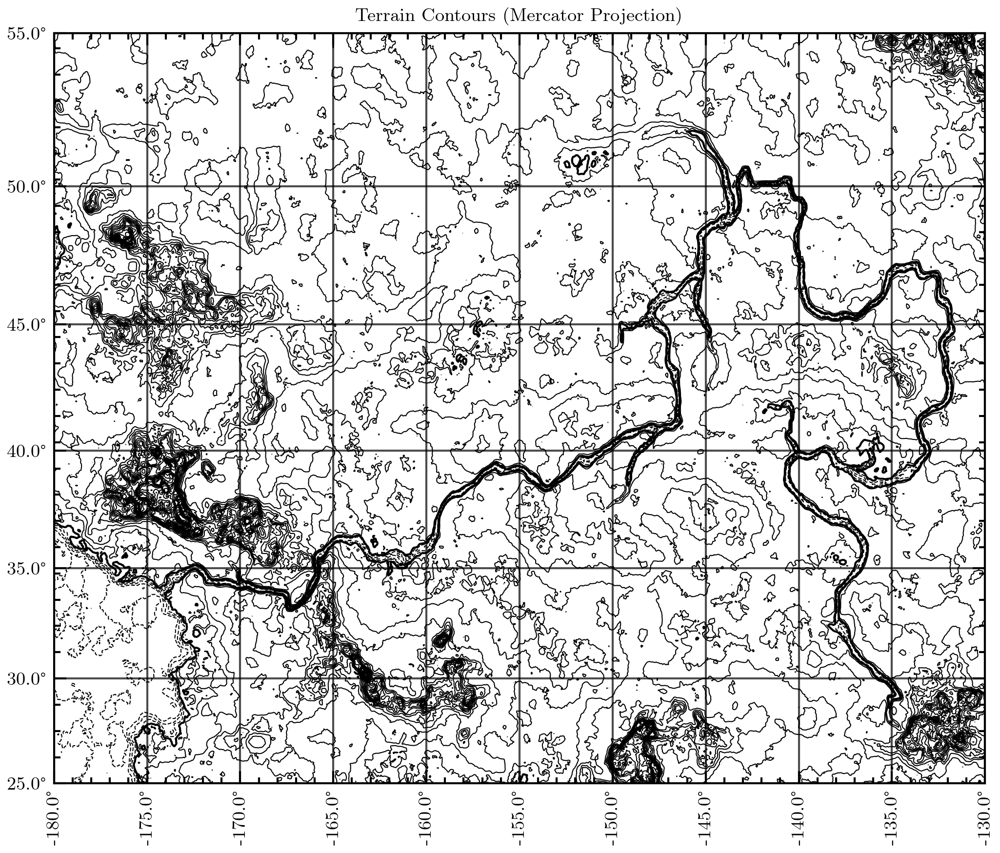

In [42]:
import numpy as np
import matplotlib.pyplot as plt

def lat_to_mercator_deg(y_deg):
    """Convert latitude to Mercator coordinates in degrees"""
    y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
    return np.degrees(y_merc)

def mercator_contour_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0,
    contour_interval=100
):
    # Input validation
    assert len(lat_vals) == height_grid.shape[0], "lat_vals length must match height_grid rows"
    assert len(lon_vals) == height_grid.shape[1], "lon_vals length must match height_grid columns"
    
    # Convert latitudes to Mercator projection
    lat_merc = lat_to_mercator_deg(lat_vals)
    lon_grid, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Calculate contour levels
    min_elev = np.nanmin(height_grid)
    max_elev = np.nanmax(height_grid)
    levels = np.arange(
        np.floor(min_elev / contour_interval) * contour_interval,
        np.ceil(max_elev / contour_interval) * contour_interval + contour_interval,
        contour_interval
    )

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

    try:
        # Main contour lines
        cs = ax.contour(lon_grid, lat_merc_grid, height_grid, 
                       levels=levels, colors='black', linewidths=0.5)
        
        # Thicker zero contour if applicable
        if (center_height >= min_elev) and (center_height <= max_elev):
            ax.contour(lon_grid, lat_merc_grid, height_grid, 
                      levels=[center_height], colors='black', linewidths=1)
            
        # Optional grid and axes
        if axline:
            ax.axhline(0, color="black", linewidth=1)
            ax.axvline(0, color="black", linewidth=1)
        if grid:
            ax.grid(linestyle='-', alpha=0.7)

        # Set aspect ratio and limits
        ax.set_aspect('equal')
        ax.set_xlim(longlims)
        ax.set_ylim(lat_to_mercator_deg(np.array(latlims)))

        # Configure ticks
        lat_ticks = np.arange(np.ceil(latlims[0]/dlat)*dlat, 
                            np.floor(latlims[1]/dlat)*dlat + dlat, 
                            dlat)
        lon_ticks = np.arange(np.ceil(longlims[0]/dlong)*dlong, 
                             np.floor(longlims[1]/dlong)*dlong + dlong, 
                             dlong)
        
        ax.set_xticks(lon_ticks)
        ax.set_xticklabels([f"{lon}°" for lon in lon_ticks])
        ax.set_yticks(lat_to_mercator_deg(lat_ticks))
        ax.set_yticklabels([f"{lat}°" for lat in lat_ticks])
        ax.tick_params(axis='x', rotation=long_label_rotation)

        plt.title("Terrain Contours (Mercator Projection)")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        plt.close()
        raise RuntimeError(f"Failed to create contour plot: {str(e)}")

mercator_contour_plot(
    lat_vals, lon_vals, heights,
    longlims=(-180, -130),
    latlims=(25, 55),
    dlong=5,
    dlat=5,
    contour_interval=250
)

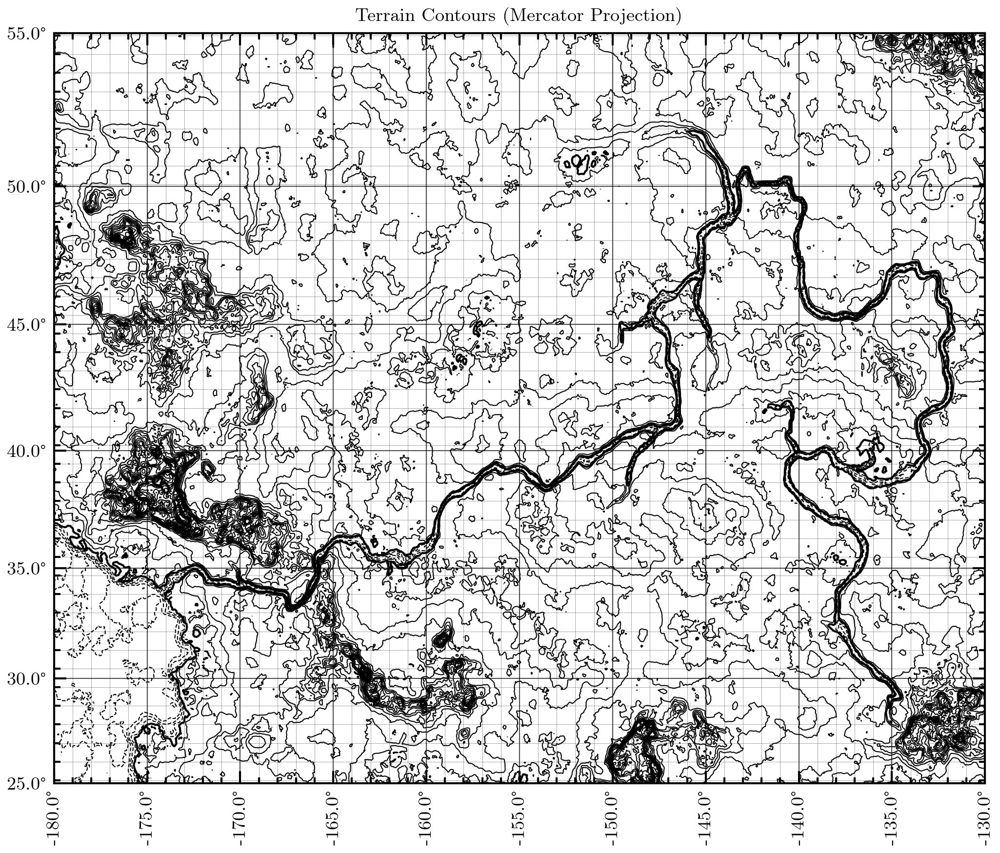

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

def lat_to_mercator_deg(y_deg):
    """Convert latitude to Mercator coordinates in degrees"""
    y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
    return np.degrees(y_merc)

def mercator_contour_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    minor_dlong=2, minor_dlat=2,  # Added minor tick intervals
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0,
    contour_interval=100
):
    # Input validation
    assert len(lat_vals) == height_grid.shape[0], "lat_vals length must match height_grid rows"
    assert len(lon_vals) == height_grid.shape[1], "lon_vals length must match height_grid columns"
    
    # Convert latitudes to Mercator projection
    lat_merc = lat_to_mercator_deg(lat_vals)
    lon_grid, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Calculate contour levels
    min_elev = np.nanmin(height_grid)
    max_elev = np.nanmax(height_grid)
    levels = np.arange(
        np.floor(min_elev / contour_interval) * contour_interval,
        np.ceil(max_elev / contour_interval) * contour_interval + contour_interval,
        contour_interval
    )

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

    try:
        # Main contour lines
        cs = ax.contour(lon_grid, lat_merc_grid, height_grid, 
                       levels=levels, colors='black', linewidths=0.5)
        
        # Thicker zero contour if applicable
        if (center_height >= min_elev) and (center_height <= max_elev):
            ax.contour(lon_grid, lat_merc_grid, height_grid, 
                      levels=[center_height], colors='black', linewidths=1)

        # Optional central axes
        if axline:
            ax.axhline(0, color="black", linewidth=1)
            ax.axvline(0, color="black", linewidth=1)

        # Configure major ticks
        lat_ticks = np.arange(np.ceil(latlims[0]/dlat)*dlat, 
                            np.floor(latlims[1]/dlat)*dlat + dlat, 
                            dlat)
        lon_ticks = np.arange(np.ceil(longlims[0]/dlong)*dlong, 
                             np.floor(longlims[1]/dlong)*dlong + dlong, 
                             dlong)
        
        ax.set_xticks(lon_ticks)
        ax.set_xticklabels([f"{lon}°" for lon in lon_ticks])
        ax.set_yticks(lat_to_mercator_deg(lat_ticks))
        ax.set_yticklabels([f"{lat}°" for lat in lat_ticks])
        ax.tick_params(axis='x', rotation=long_label_rotation)

        # Configure minor ticks (properly projected)
        ax.xaxis.set_minor_locator(MultipleLocator(minor_dlong))
        ax.yaxis.set_minor_locator(MultipleLocator(minor_dlat))
        
        # Solid grid lines
        if grid:
            ax.grid(which='major', linestyle='-', linewidth=0.5, alpha=0.7)
            ax.grid(which='minor', linestyle='-', linewidth=0.2, alpha=0.4)

        # Set aspect ratio and limits
        ax.set_aspect('equal')
        ax.set_xlim(longlims)
        ax.set_ylim(lat_to_mercator_deg(np.array(latlims)))

        plt.title("Terrain Contours (Mercator Projection)")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        plt.close()
        raise RuntimeError(f"Failed to create contour plot: {str(e)}")


mercator_contour_plot(
    lat_vals, lon_vals, heights,
    longlims=(-180, -130),
    latlims=(25, 55),
    dlong=5,
    dlat=5,
    minor_dlong=1,  # minor ticks every 1° longitude
    minor_dlat=1,   # minor ticks every 1° latitude
    contour_interval=250
)

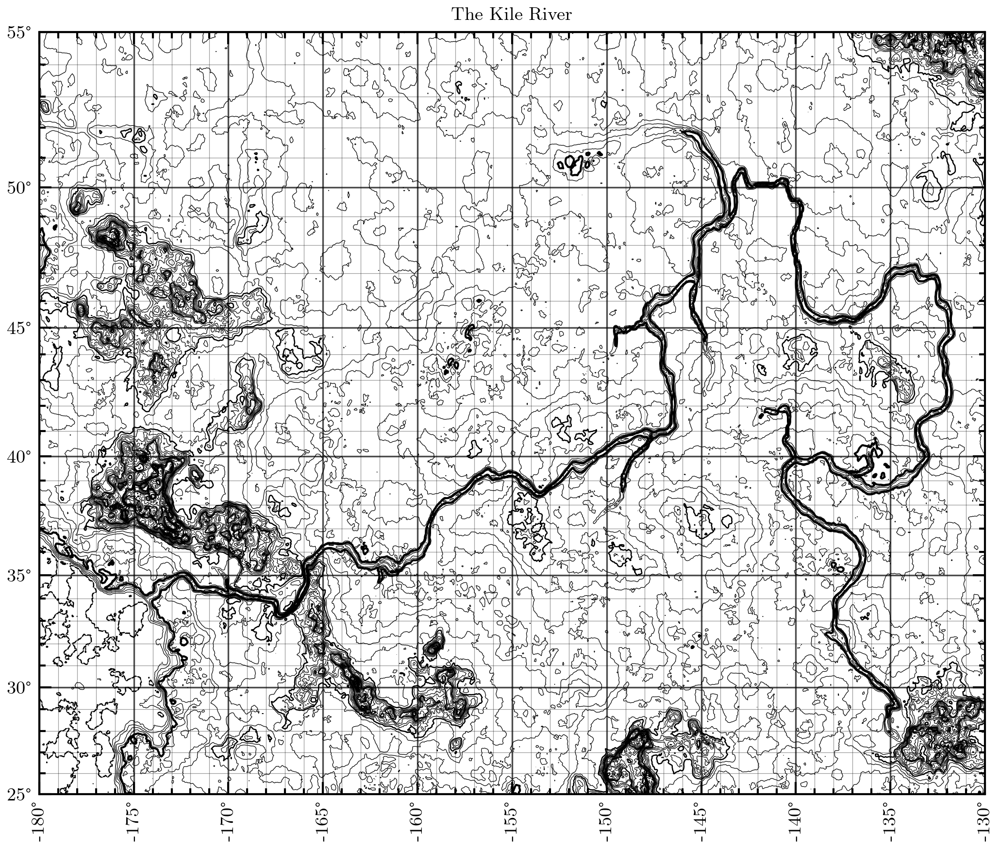

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FixedLocator

def lat_to_mercator_deg(y_deg):
    """Convert latitude to Mercator coordinates in degrees"""
    y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
    return np.degrees(y_merc)

def mercator_contour_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    minor_dlong=2, minor_dlat=2,  # Minor tick intervals
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0,
    contour_interval=100
):
    # Input validation
    assert len(lat_vals) == height_grid.shape[0], "lat_vals length must match height_grid rows"
    assert len(lon_vals) == height_grid.shape[1], "lon_vals length must match height_grid columns"
    
    # Convert latitudes to Mercator projection
    lat_merc = lat_to_mercator_deg(lat_vals)
    lon_grid, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Calculate contour levels
    min_elev = np.nanmin(height_grid)
    max_elev = np.nanmax(height_grid)
    # Replace the existing levels calculation with:
    major_level_interval = 1000
    minor_level_interval = 200
    major_levels = np.arange(
        np.floor(min_elev / major_level_interval) * major_level_interval,
        np.ceil(max_elev / major_level_interval) * major_level_interval + major_level_interval,
        major_level_interval
    )
    minor_levels = np.arange(
        np.floor(min_elev / minor_level_interval) * minor_level_interval,
        np.ceil(max_elev / minor_level_interval) * minor_level_interval + minor_level_interval,
        minor_level_interval
    )

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

    try:
        # Main contour lines
        # Major contours (500 m, thicker lines)
        cs_major = ax.contour(
            lon_grid, lat_merc_grid, height_grid,
            levels=major_levels, colors='black', linewidths=0.6
        )
        # Minor contours (100 m, thinner lines)
        cs_minor = ax.contour(
            lon_grid, lat_merc_grid, height_grid,
            levels=minor_levels, colors='black', linewidths=0.3, linestyles='-'
        )
        # Thicker zero contour if applicable
        if (center_height >= min_elev) and (center_height <= max_elev):
            ax.contour(lon_grid, lat_merc_grid, height_grid, 
                      levels=[center_height], colors='black', linewidths=1)

        # Optional central axes
        if axline:
            ax.axhline(0, color="black", linewidth=1)
            ax.axvline(0, color="black", linewidth=1)

        # Configure MAJOR ticks
        lat_ticks = np.arange(np.ceil(latlims[0]/dlat)*dlat, 
                            np.floor(latlims[1]/dlat)*dlat + dlat, 
                            dlat)
        lon_ticks = np.arange(np.ceil(longlims[0]/dlong)*dlong, 
                             np.floor(longlims[1]/dlong)*dlong + dlong, 
                             dlong)
        
        ax.set_xticks(lon_ticks)
        ax.set_xticklabels([f"{int(lon)}°" for lon in lon_ticks])
        ax.set_yticks(lat_to_mercator_deg(lat_ticks))
        ax.set_yticklabels([f"{int(lat)}°" for lat in lat_ticks])
        ax.tick_params(axis='x', rotation=long_label_rotation)

        # Configure MINOR ticks (Mercator-adjusted for y-axis)
        if minor_dlong > 0:
            minor_lon_ticks = np.arange(np.ceil(longlims[0]/minor_dlong)*minor_dlong, 
                                   np.floor(longlims[1]/minor_dlong)*minor_dlong + minor_dlong, 
                                   minor_dlong)
            ax.set_xticks(minor_lon_ticks, minor=True)  # Linear spacing (correct for longitude)
        
        if minor_dlat > 0:
            # Generate minor ticks in true latitude, then project to Mercator
            minor_lat_ticks = np.arange(np.ceil(latlims[0]/minor_dlat)*minor_dlat, 
                                   np.floor(latlims[1]/minor_dlat)*minor_dlat + minor_dlat, 
                                   minor_dlat)
            ax.set_yticks(lat_to_mercator_deg(minor_lat_ticks), minor=True)  # Correct Mercator spacing
        
        # Solid grid lines (major and minor)
        if grid:
            ax.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.7)
            ax.grid(which='minor', linestyle='-', linewidth=0.3, alpha=0.4)

        # Set aspect ratio and limits
        ax.set_aspect('equal')
        ax.set_xlim(longlims)
        ax.set_ylim(lat_to_mercator_deg(np.array(latlims)))

        plt.title("The Kile River")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        plt.close()
        raise RuntimeError(f"Failed to create contour plot: {str(e)}")


mercator_contour_plot(
    lat_vals, lon_vals, heights,
    longlims=(-180, -130),
    latlims=(25, 55),
    dlong=5,
    dlat=5,
    minor_dlong=1,  # Minor ticks every 1° longitude
    minor_dlat=1,   # Minor ticks every 1° latitude (true spacing)
    contour_interval=250
)

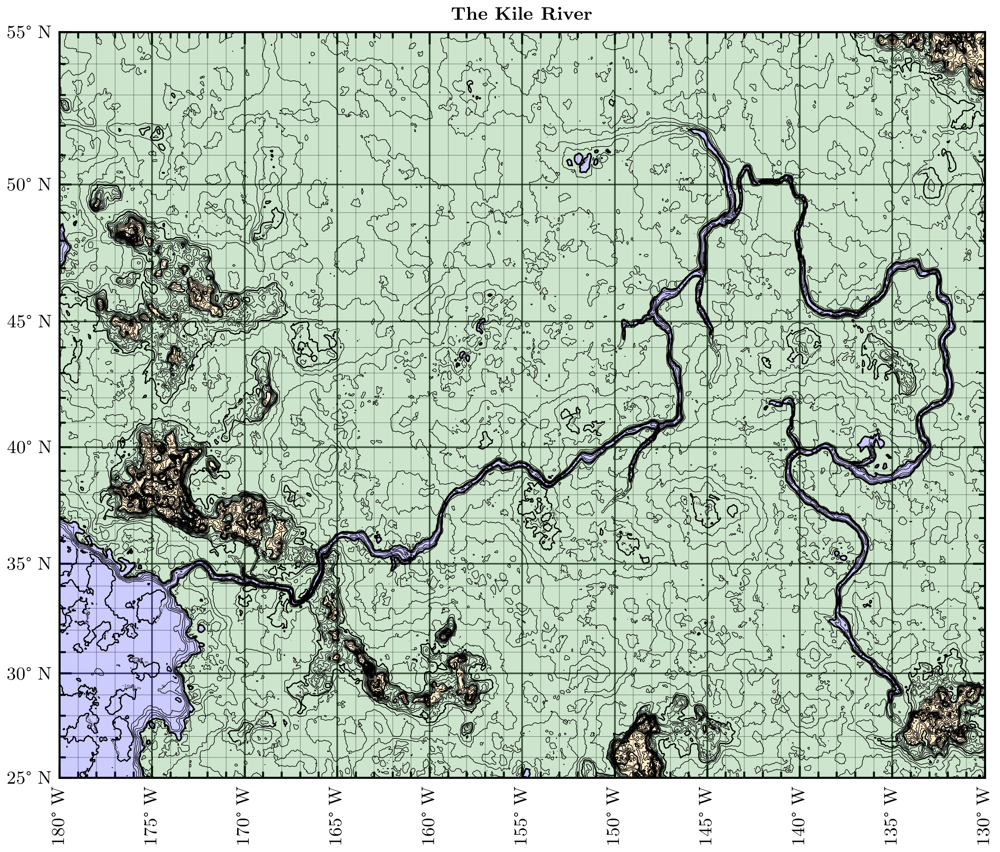

In [76]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FixedLocator

def lat_to_mercator_deg(y_deg):
    """Convert latitude to Mercator coordinates in degrees"""
    y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
    return np.degrees(y_merc)

def add_checkered_border(ax, xlim, ylim, checker_size=2.0, n_checkers=10):
    """Adds checkered pattern to map edges."""
    from matplotlib.patches import Rectangle

    # Horizontal edges (top/bottom)
    for y in [ylim[0], ylim[1]]:
        for i, x in enumerate(np.linspace(xlim[0], xlim[1], n_checkers + 1)):
            color = 'black' if i % 2 == 0 else 'white'
            rect = Rectangle(
                (x, y - checker_size/2),  # Bottom-left corner
                checker_size, checker_size,
                facecolor=color, edgecolor='black', lw=0.5
            )
            ax.add_patch(rect)

    # Vertical edges (left/right)
    for x in [xlim[0], xlim[1]]:
        for i, y in enumerate(np.linspace(ylim[0], ylim[1], n_checkers + 1)):
            color = 'black' if i % 2 == 0 else 'white'
            rect = Rectangle(
                (x - checker_size/2, y),
                checker_size, checker_size,
                facecolor=color, edgecolor='black', lw=0.5
            )
            ax.add_patch(rect)
            
def mercator_contour_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    minor_dlong=2, minor_dlat=2,  # Minor tick intervals
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0,
    contour_interval=100
):
    # Input validation
    assert len(lat_vals) == height_grid.shape[0], "lat_vals length must match height_grid rows"
    assert len(lon_vals) == height_grid.shape[1], "lon_vals length must match height_grid columns"
    
    # Convert latitudes to Mercator projection
    lat_merc = lat_to_mercator_deg(lat_vals)
    lon_grid, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Calculate contour levels
    min_elev = np.nanmin(height_grid)
    max_elev = np.nanmax(height_grid)
    # Replace the existing levels calculation with:
    major_level_interval = 1000
    minor_level_interval = 200
    major_levels = np.arange(
        np.floor(min_elev / major_level_interval) * major_level_interval,
        np.ceil(max_elev / major_level_interval) * major_level_interval + major_level_interval,
        major_level_interval
    )
    minor_levels = np.arange(
        np.floor(min_elev / minor_level_interval) * minor_level_interval,
        np.ceil(max_elev / minor_level_interval) * minor_level_interval + minor_level_interval,
        minor_level_interval
    )

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 400)

    try:
        # Main contour lines
        # Define altitude ranges and colors
        altitude_ranges = [np.nanmin(height_grid), 0, 2000, np.nanmax(height_grid)]
        colors = ['blue', 'green', 'orange']  # <0: blue, 0-2000: green, >2000: red

        # Plot filled contours
        cf = ax.contourf(
            lon_grid, lat_merc_grid, height_grid,
            levels=altitude_ranges,
            colors=colors,
            alpha=0.2,  # Transparency (adjust as needed)
            extend='both'
        )
        # Major contours (500 m, thicker lines)
        cs_major = ax.contour(
            lon_grid, lat_merc_grid, height_grid,
            levels=major_levels, colors='black', linewidths=0.6,
            linestyles='solid'   
        )
        # Add labels to major contours
        ax.clabel(
            cs_major, 
            inline=True,          # Labels appear inline with the contour lines
            fontsize=2,          # Adjust font size
            fmt='%d m',          # Format: "500 m", "1000 m", etc.
            colors='black'       # Label color
        )
        # Minor contours (100 m, thinner lines)
        cs_minor = ax.contour(
            lon_grid, lat_merc_grid, height_grid,
            levels=minor_levels, colors='black', linewidths=0.3, linestyles='-'
        )
        # Thicker zero contour if applicable
        if (center_height >= min_elev) and (center_height <= max_elev):
            ax.contour(lon_grid, lat_merc_grid, height_grid, 
                      levels=[center_height], colors='black', linewidths=0.8)

        # Optional central axes
        if axline:
            ax.axhline(0, color="black", linewidth=1)
            ax.axvline(0, color="black", linewidth=1)

        # Configure MAJOR ticks
        lat_ticks = np.arange(np.ceil(latlims[0]/dlat)*dlat, 
                            np.floor(latlims[1]/dlat)*dlat + dlat, 
                            dlat)
        lon_ticks = np.arange(np.ceil(longlims[0]/dlong)*dlong, 
                             np.floor(longlims[1]/dlong)*dlong + dlong, 
                             dlong)
        
        ax.set_xticks(lon_ticks)
        ax.set_xticklabels([f"{-int(lon)}° W" for lon in lon_ticks])
        ax.set_yticks(lat_to_mercator_deg(lat_ticks))
        ax.set_yticklabels([f"{int(lat)}° N" for lat in lat_ticks])
        ax.tick_params(axis='x', rotation=long_label_rotation)

        # Configure MINOR ticks (Mercator-adjusted for y-axis)
        if minor_dlong > 0:
            minor_lon_ticks = np.arange(np.ceil(longlims[0]/minor_dlong)*minor_dlong, 
                                   np.floor(longlims[1]/minor_dlong)*minor_dlong + minor_dlong, 
                                   minor_dlong)
            ax.set_xticks(minor_lon_ticks, minor=True)  # Linear spacing (correct for longitude)
        
        if minor_dlat > 0:
            # Generate minor ticks in true latitude, then project to Mercator
            minor_lat_ticks = np.arange(np.ceil(latlims[0]/minor_dlat)*minor_dlat, 
                                   np.floor(latlims[1]/minor_dlat)*minor_dlat + minor_dlat, 
                                   minor_dlat)
            ax.set_yticks(lat_to_mercator_deg(minor_lat_ticks), minor=True)  # Correct Mercator spacing
        
        # Solid grid lines (major and minor)
        if grid:
            ax.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.7)
            ax.grid(which='minor', linestyle='-', linewidth=0.3, alpha=0.4)

        # Set aspect ratio and limits
        ax.set_aspect('equal')
        ax.set_xlim(longlims)
        ax.set_ylim(lat_to_mercator_deg(np.array(latlims)))

        plt.title(r"\textbf{The Kile River}")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        plt.close()
        raise RuntimeError(f"Failed to create contour plot: {str(e)}")


mercator_contour_plot(
    lat_vals, lon_vals, heights,
    longlims=(-180, -130),
    latlims=(25, 55),
    dlong=5,
    dlat=5,
    minor_dlong=1,  # Minor ticks every 1° longitude
    minor_dlat=1,   # Minor ticks every 1° latitude (true spacing)
    contour_interval=250
)


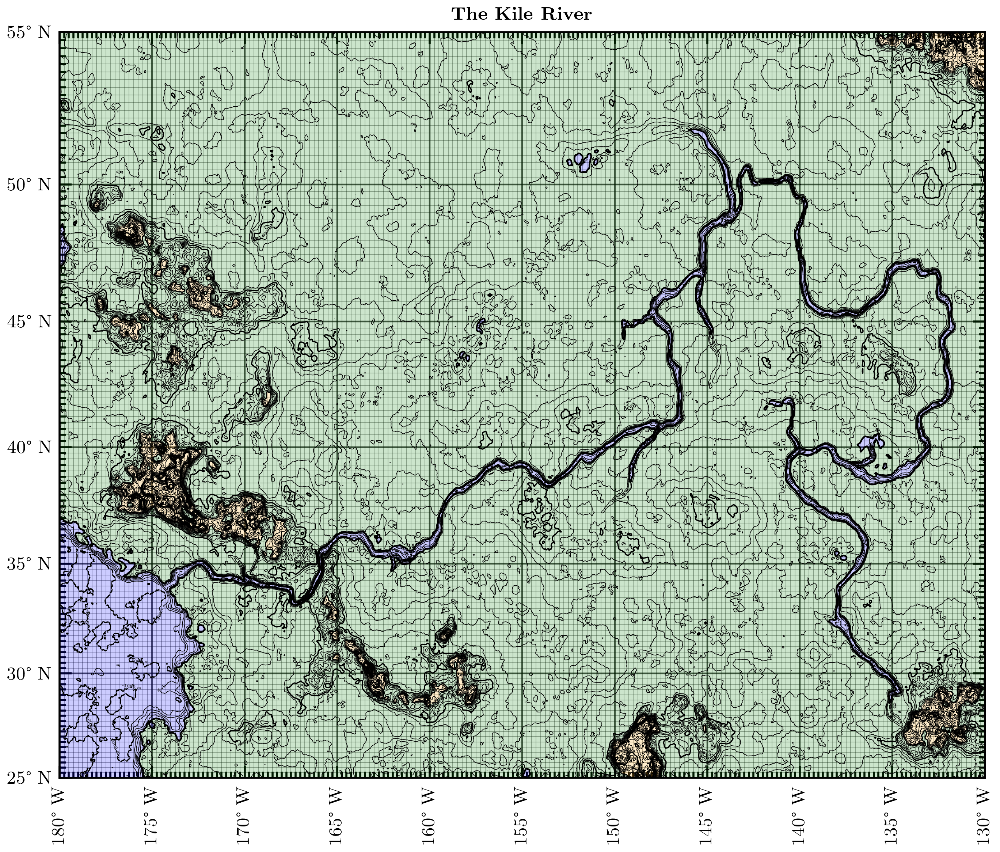

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FixedLocator

def lat_to_mercator_deg(y_deg):
    """Convert latitude to Mercator coordinates in degrees"""
    y_merc = np.log(np.tan(np.pi / 4 + (np.radians(y_deg) / 2)))
    return np.degrees(y_merc)

def add_checkered_border(ax, xlim, ylim, checker_size=2.0, n_checkers=10):
    """Adds checkered pattern to map edges."""
    from matplotlib.patches import Rectangle

    # Horizontal edges (top/bottom)
    for y in [ylim[0], ylim[1]]:
        for i, x in enumerate(np.linspace(xlim[0], xlim[1], n_checkers + 1)):
            color = 'black' if i % 2 == 0 else 'white'
            rect = Rectangle(
                (x, y - checker_size/2),  # Bottom-left corner
                checker_size, checker_size,
                facecolor=color, edgecolor='black', lw=0.5
            )
            ax.add_patch(rect)

    # Vertical edges (left/right)
    for x in [xlim[0], xlim[1]]:
        for i, y in enumerate(np.linspace(ylim[0], ylim[1], n_checkers + 1)):
            color = 'black' if i % 2 == 0 else 'white'
            rect = Rectangle(
                (x - checker_size/2, y),
                checker_size, checker_size,
                facecolor=color, edgecolor='black', lw=0.5
            )
            ax.add_patch(rect)
            
def mercator_contour_plot(
    lat_vals, lon_vals, height_grid,
    longlims=(-180, 180), latlims=(-85, 85),
    dlong=10, dlat=10,
    minor_dlong=2, minor_dlat=2,  # Minor tick intervals
    axline=True, grid=True,
    long_label_rotation=90,
    center_height=0,
    contour_interval=100
):
    # Input validation
    assert len(lat_vals) == height_grid.shape[0], "lat_vals length must match height_grid rows"
    assert len(lon_vals) == height_grid.shape[1], "lon_vals length must match height_grid columns"
    
    # Convert latitudes to Mercator projection
    lat_merc = lat_to_mercator_deg(lat_vals)
    lon_grid, lat_merc_grid = np.meshgrid(lon_vals, lat_merc)

    # Calculate contour levels
    min_elev = np.nanmin(height_grid)
    max_elev = np.nanmax(height_grid)
    # Replace the existing levels calculation with:
    major_level_interval = 1000
    minor_level_interval = 200
    major_levels = np.arange(
        np.floor(min_elev / major_level_interval) * major_level_interval,
        np.ceil(max_elev / major_level_interval) * major_level_interval + major_level_interval,
        major_level_interval
    )
    minor_levels = np.arange(
        np.floor(min_elev / minor_level_interval) * minor_level_interval,
        np.ceil(max_elev / minor_level_interval) * minor_level_interval + minor_level_interval,
        minor_level_interval
    )

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6), dpi = 400)

    try:
        # Main contour lines
        # Define altitude ranges and colors
        altitude_ranges = [np.nanmin(height_grid), 0, 2000, np.nanmax(height_grid)]
        colors = ['blue', 'green', 'orange']  # <0: blue, 0-2000: green, >2000: red

        # Plot filled contours
        cf = ax.contourf(
            lon_grid, lat_merc_grid, height_grid,
            levels=altitude_ranges,
            colors=colors,
            alpha=0.2,  # Transparency (adjust as needed)
            extend='both'
        )
        # Major contours (500 m, thicker lines)
        cs_major = ax.contour(
            lon_grid, lat_merc_grid, height_grid,
            levels=major_levels, colors='black', linewidths=0.6
        )
        # Add labels to major contours
        ax.clabel(
            cs_major, 
            inline=True,          # Labels appear inline with the contour lines
            fontsize=2,          # Adjust font size
            fmt='%d m',          # Format: "500 m", "1000 m", etc.
            colors='black'       # Label color
        )
        # Minor contours (100 m, thinner lines)
        cs_minor = ax.contour(
            lon_grid, lat_merc_grid, height_grid,
            levels=minor_levels, colors='black', linewidths=0.3, linestyles='-'
        )
        # Thicker zero contour if applicable
        if (center_height >= min_elev) and (center_height <= max_elev):
            ax.contour(lon_grid, lat_merc_grid, height_grid, 
                      levels=[center_height], colors='black', linewidths=0.8)

        # Optional central axes
        if axline:
            ax.axhline(0, color="black", linewidth=1)
            ax.axvline(0, color="black", linewidth=1)

        # Configure MAJOR ticks
        lat_ticks = np.arange(np.ceil(latlims[0]/dlat)*dlat, 
                            np.floor(latlims[1]/dlat)*dlat + dlat, 
                            dlat)
        lon_ticks = np.arange(np.ceil(longlims[0]/dlong)*dlong, 
                             np.floor(longlims[1]/dlong)*dlong + dlong, 
                             dlong)
        
        ax.set_xticks(lon_ticks)
        ax.set_xticklabels([f"{-int(lon)}° W" for lon in lon_ticks])
        ax.set_yticks(lat_to_mercator_deg(lat_ticks))
        ax.set_yticklabels([f"{int(lat)}° N" for lat in lat_ticks])
        ax.tick_params(axis='x', rotation=long_label_rotation)

        # Configure MINOR ticks (Mercator-adjusted for y-axis)
        if minor_dlong > 0:
            minor_lon_ticks = np.arange(np.ceil(longlims[0]/minor_dlong)*minor_dlong, 
                                   np.floor(longlims[1]/minor_dlong)*minor_dlong + minor_dlong, 
                                   minor_dlong)
            ax.set_xticks(minor_lon_ticks, minor=True)  # Linear spacing (correct for longitude)
        
        if minor_dlat > 0:
            # Generate minor ticks in true latitude, then project to Mercator
            minor_lat_ticks = np.arange(np.ceil(latlims[0]/minor_dlat)*minor_dlat, 
                                   np.floor(latlims[1]/minor_dlat)*minor_dlat + minor_dlat, 
                                   minor_dlat)
            ax.set_yticks(lat_to_mercator_deg(minor_lat_ticks), minor=True)  # Correct Mercator spacing
        
        # Solid grid lines (major and minor)
        if grid:
            ax.grid(which='major', linestyle='-', linewidth=0.8, alpha=0.7)
            ax.grid(which='minor', linestyle='-', linewidth=0.3, alpha=0.4)

        # Set aspect ratio and limits
        ax.set_aspect('equal')
        ax.set_xlim(longlims)
        ax.set_ylim(lat_to_mercator_deg(np.array(latlims)))

        plt.title(r"\textbf{The Kile River}")
        plt.tight_layout()
        plt.show()

    except Exception as e:
        plt.close()
        raise RuntimeError(f"Failed to create contour plot: {str(e)}")


mercator_contour_plot(
    lat_vals, lon_vals, heights,
    longlims=(-180, -130),
    latlims=(25, 55),
    dlong=5,
    dlat=5,
    minor_dlong=0.25,  # Minor ticks every 1° longitude
    minor_dlat=0.25,   # Minor ticks every 1° latitude (true spacing)
    contour_interval=250
)


In [ ]:
## NEXT STOP, OLD CALEDONIA